# Tutorial

> The goal of this challenge is to find all instances of dolphins in a picture and then color pixes of each dolphin with a unique color.

Please open this notebook in Colab to edit it and submit a solution:
    
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/cro-ai-league/dolphins-recognition-challenge/blob/master/notebooks/00_tutorial/DolphinsTutorial.ipynb)

We need to change runtime to GPU to speed up training:

!["Change runtime"](images/change_runtime.png)

In [ ]:
err = !nvidia-smi
if "failed" in err[0]:
    raise Exception("Change runtime in menu to GPU (Runtime->Change runtime type->GPU)")
    
!nvidia-smi

Tue Jan  5 13:38:11 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.80.02    Driver Version: 450.80.02    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:01:00.0  On |                  N/A |
|  0%   51C    P2    58W / 275W |   1190MiB / 11177MiB |      2%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Import `dolphins_recognition_challenge` library if it is already installed or install it if it is not. Please restart the runtime by clicking on the button bellow if it say so.

In [ ]:
try:
    import dolphins_recognition_challenge
except Exception:
    if "google.colab" in str(get_ipython()):
        print("Running on CoLab")
        !pip install dolphins-recognition-challenge

Import all necessary packages including `dolphins_recognition_challenge`

In [ ]:
import dolphins_recognition_challenge

import numpy as np
import PIL
from PIL import Image

import torch
import torchvision
import pandas as pd
import seaborn as sns

## Download data

We start by downloading and visualizing the dataset containing 200 photographs with one or more dolphins split into a training set containing 160 photographs and a validation set containing 40 photographs.

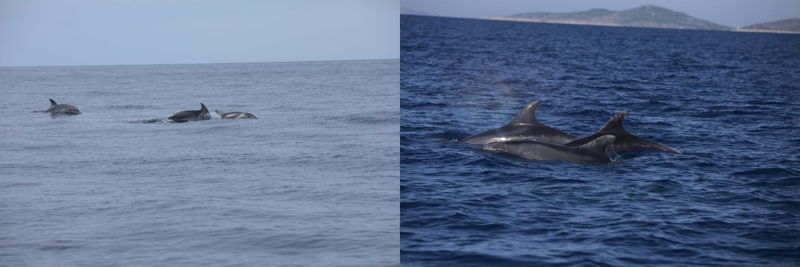

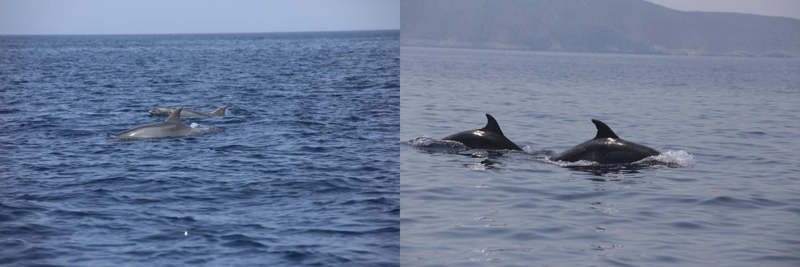

In [ ]:
from dolphins_recognition_challenge.datasets import get_dataset, display_batches
    
data_loader, data_loader_test = get_dataset("segmentation", batch_size=2)

display_batches(data_loader, n_batches=2)

## Data augmentation

In order to prevent overfitting which happens when the dataset size is too small, we perform a number of transformations to increase the size of the dataset. One transofrmation implemented in the Torch vision library is `RandomHorizontalFlip` and we will implemented `MyColorJitter` which is basically just a wrapper around `torchvision.transforms.ColorJitter` class. However, we cannot use this class directly without a wrapper because a transofrmation could possibly affect targets and not just the image. For example, if we were to implement RandomCrop, we would need to crop segmentation masks and readjust bounding boxes as well.

In [ ]:
class MyColorJitter:
    def __init__(self, brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5):
        self.torch_color_jitter = torchvision.transforms.ColorJitter(
            brightness=brightness, contrast=contrast, saturation=saturation, hue=hue
        )

    def __call__(self, image, target):
        image = self.torch_color_jitter(image)
        return image, target

We will make a series of transformations on an image and we will combine all those transofrmations in a single one as follows:

In [ ]:
from dolphins_recognition_challenge.datasets import ToTensor, ToPILImage, Compose, RandomHorizontalFlip

def get_tensor_transforms(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(
            MyColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5)
        )
        transforms.append(RandomHorizontalFlip(0.5))
        # TODO: add additional transforms: e.g. random crop
    return Compose(transforms)

With data augementation defined, we are ready to generate the actual datasets used for training our models.

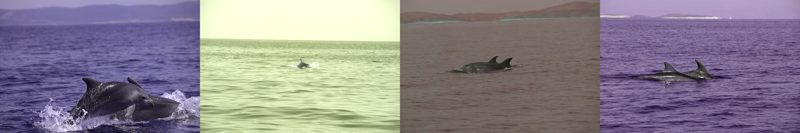

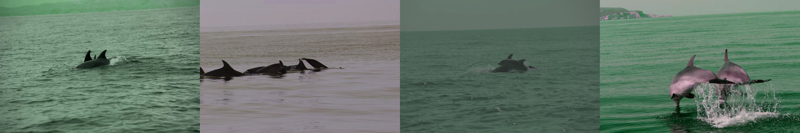

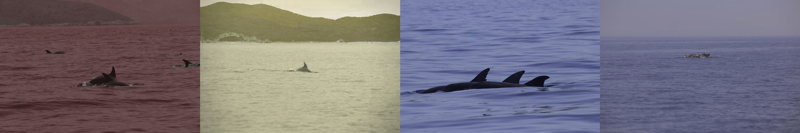

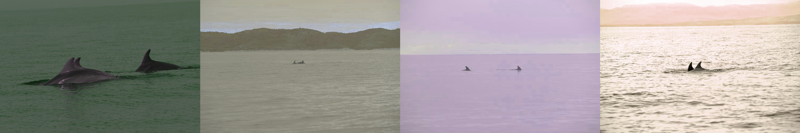

In [ ]:
batch_size = 4

data_loader, data_loader_test = get_dataset(
    "segmentation", get_tensor_transforms=get_tensor_transforms, batch_size=batch_size
)

display_batches(data_loader, n_batches=4)

> Tip: incorporate more transformation classes such as RandomCrop etc. (https://pytorch.org/docs/stable/torchvision/transforms.html)

## Model

We can reuse already trained models for instance segmentation trained on other dataset and finetune it for our particular problem, in our case on dataset with dolphins.

In [ ]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

def get_instance_segmentation_model(hidden_layer_size, box_score_thresh=0.5):
    # our dataset has two classes only - background and dolphin    
    num_classes = 2
    
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(
        pretrained=True, 
        box_score_thresh=box_score_thresh, 
    )

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels

    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_channels=in_features_mask, 
        dim_reduced=hidden_layer_size,
        num_classes=num_classes
    )

    return model

Before using a model constructed, we should move it to appropriate device. We will test if we have GPU available and move it to there if possible.

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# get the model using our helper function
model = get_instance_segmentation_model(hidden_layer_size=256)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

We have implemented a function for training a model for one epoch - meaning using each image from the training dataset exactly once. Let's train for 25 epochs and see what predictions we make after each epoch.

Epoch #0


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


Epoch: [0]  [ 0/40]  eta: 0:01:17  lr: 0.000133  loss: 4.8085 (4.8085)  loss_classifier: 0.7792 (0.7792)  loss_box_reg: 0.3864 (0.3864)  loss_mask: 3.5923 (3.5923)  loss_objectness: 0.0240 (0.0240)  loss_rpn_box_reg: 0.0265 (0.0265)  time: 1.9442  data: 1.1354  max mem: 4478
Epoch: [0]  [20/40]  eta: 0:00:14  lr: 0.002695  loss: 0.8709 (1.5972)  loss_classifier: 0.1803 (0.2949)  loss_box_reg: 0.2340 (0.2652)  loss_mask: 0.3832 (0.9715)  loss_objectness: 0.0230 (0.0432)  loss_rpn_box_reg: 0.0137 (0.0224)  time: 0.6867  data: 0.0092  max mem: 5181
Epoch: [0]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.6621 (1.1604)  loss_classifier: 0.1056 (0.2055)  loss_box_reg: 0.2302 (0.2501)  loss_mask: 0.2613 (0.6358)  loss_objectness: 0.0107 (0.0309)  loss_rpn_box_reg: 0.0145 (0.0381)  time: 0.6721  data: 0.0107  max mem: 5181
Epoch: [0] Total time: 0:00:28 (0.7126 s / it)


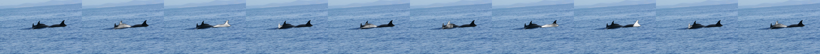

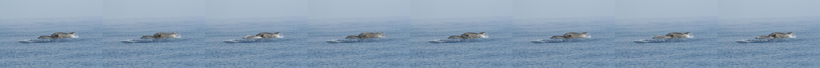

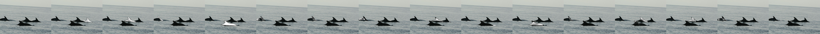

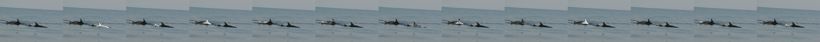

Epoch #1
Epoch: [1]  [ 0/40]  eta: 0:01:23  lr: 0.005000  loss: 0.7476 (0.7476)  loss_classifier: 0.1145 (0.1145)  loss_box_reg: 0.2906 (0.2906)  loss_mask: 0.2447 (0.2447)  loss_objectness: 0.0146 (0.0146)  loss_rpn_box_reg: 0.0832 (0.0832)  time: 2.0971  data: 1.3459  max mem: 5181
Epoch: [1]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.5489 (0.5564)  loss_classifier: 0.0792 (0.0833)  loss_box_reg: 0.1947 (0.2081)  loss_mask: 0.2083 (0.2201)  loss_objectness: 0.0082 (0.0124)  loss_rpn_box_reg: 0.0085 (0.0325)  time: 0.6994  data: 0.0093  max mem: 5183
Epoch: [1]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.4416 (0.5237)  loss_classifier: 0.0806 (0.0822)  loss_box_reg: 0.1522 (0.1876)  loss_mask: 0.2015 (0.2123)  loss_objectness: 0.0089 (0.0123)  loss_rpn_box_reg: 0.0140 (0.0294)  time: 0.6811  data: 0.0103  max mem: 5183
Epoch: [1] Total time: 0:00:29 (0.7278 s / it)


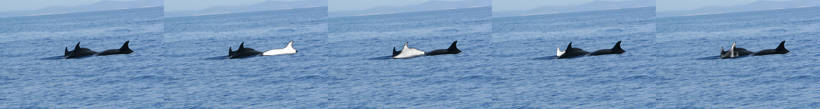

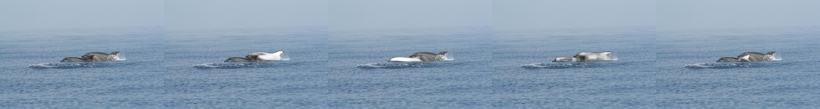

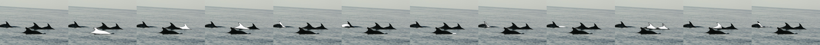

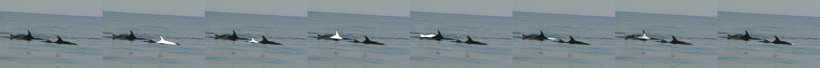

Epoch #2
Epoch: [2]  [ 0/40]  eta: 0:01:08  lr: 0.005000  loss: 0.3498 (0.3498)  loss_classifier: 0.0662 (0.0662)  loss_box_reg: 0.1201 (0.1201)  loss_mask: 0.1546 (0.1546)  loss_objectness: 0.0057 (0.0057)  loss_rpn_box_reg: 0.0032 (0.0032)  time: 1.7208  data: 0.9841  max mem: 5183
Epoch: [2]  [20/40]  eta: 0:00:14  lr: 0.005000  loss: 0.4278 (0.4317)  loss_classifier: 0.0677 (0.0748)  loss_box_reg: 0.1419 (0.1452)  loss_mask: 0.1802 (0.1798)  loss_objectness: 0.0042 (0.0061)  loss_rpn_box_reg: 0.0125 (0.0258)  time: 0.7014  data: 0.0135  max mem: 5184
Epoch: [2]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.3918 (0.4331)  loss_classifier: 0.0627 (0.0739)  loss_box_reg: 0.1381 (0.1488)  loss_mask: 0.1711 (0.1822)  loss_objectness: 0.0024 (0.0058)  loss_rpn_box_reg: 0.0139 (0.0224)  time: 0.6920  data: 0.0113  max mem: 5184
Epoch: [2] Total time: 0:00:28 (0.7243 s / it)


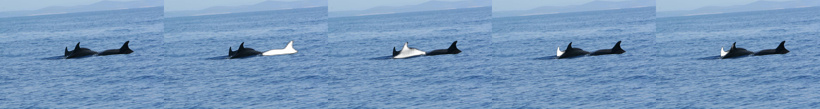

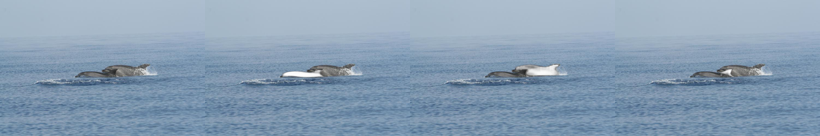

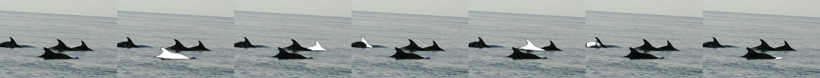

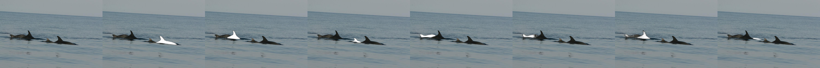

Epoch #3
Epoch: [3]  [ 0/40]  eta: 0:01:36  lr: 0.005000  loss: 0.5316 (0.5316)  loss_classifier: 0.0999 (0.0999)  loss_box_reg: 0.2088 (0.2088)  loss_mask: 0.1903 (0.1903)  loss_objectness: 0.0060 (0.0060)  loss_rpn_box_reg: 0.0266 (0.0266)  time: 2.4152  data: 1.5742  max mem: 5184
Epoch: [3]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.4021 (0.4066)  loss_classifier: 0.0633 (0.0673)  loss_box_reg: 0.1256 (0.1317)  loss_mask: 0.1862 (0.1828)  loss_objectness: 0.0034 (0.0039)  loss_rpn_box_reg: 0.0127 (0.0209)  time: 0.7119  data: 0.0115  max mem: 5184
Epoch: [3]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.3599 (0.3882)  loss_classifier: 0.0540 (0.0618)  loss_box_reg: 0.1264 (0.1255)  loss_mask: 0.1542 (0.1741)  loss_objectness: 0.0046 (0.0052)  loss_rpn_box_reg: 0.0082 (0.0216)  time: 0.7038  data: 0.0128  max mem: 5184
Epoch: [3] Total time: 0:00:30 (0.7524 s / it)


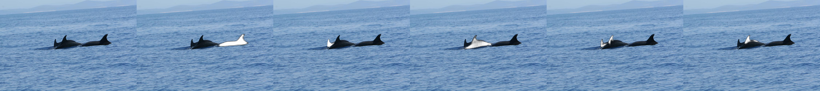

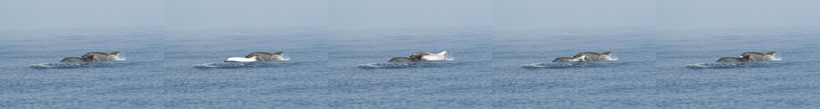

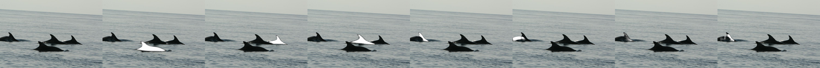

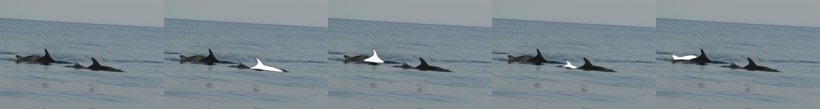

Epoch #4
Epoch: [4]  [ 0/40]  eta: 0:01:05  lr: 0.005000  loss: 0.3629 (0.3629)  loss_classifier: 0.0512 (0.0512)  loss_box_reg: 0.1069 (0.1069)  loss_mask: 0.1988 (0.1988)  loss_objectness: 0.0028 (0.0028)  loss_rpn_box_reg: 0.0033 (0.0033)  time: 1.6346  data: 0.9376  max mem: 5184
Epoch: [4]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.3589 (0.3616)  loss_classifier: 0.0526 (0.0584)  loss_box_reg: 0.1088 (0.1158)  loss_mask: 0.1722 (0.1697)  loss_objectness: 0.0045 (0.0050)  loss_rpn_box_reg: 0.0073 (0.0128)  time: 0.7118  data: 0.0126  max mem: 5184
Epoch: [4]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.3254 (0.3677)  loss_classifier: 0.0506 (0.0596)  loss_box_reg: 0.1068 (0.1181)  loss_mask: 0.1466 (0.1628)  loss_objectness: 0.0025 (0.0068)  loss_rpn_box_reg: 0.0116 (0.0204)  time: 0.6955  data: 0.0114  max mem: 5184
Epoch: [4] Total time: 0:00:29 (0.7288 s / it)


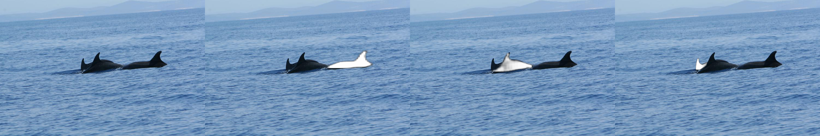

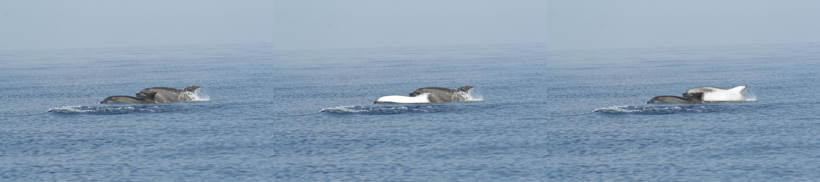

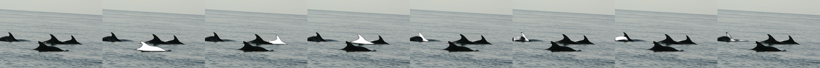

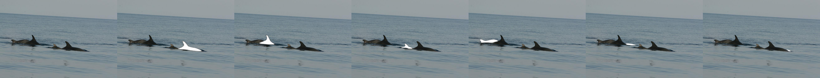

Epoch #5
Epoch: [5]  [ 0/40]  eta: 0:01:14  lr: 0.005000  loss: 0.2680 (0.2680)  loss_classifier: 0.0449 (0.0449)  loss_box_reg: 0.0888 (0.0888)  loss_mask: 0.1286 (0.1286)  loss_objectness: 0.0032 (0.0032)  loss_rpn_box_reg: 0.0024 (0.0024)  time: 1.8628  data: 1.0970  max mem: 5184
Epoch: [5]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.3418 (0.3373)  loss_classifier: 0.0539 (0.0554)  loss_box_reg: 0.1170 (0.1179)  loss_mask: 0.1498 (0.1479)  loss_objectness: 0.0053 (0.0061)  loss_rpn_box_reg: 0.0062 (0.0100)  time: 0.7153  data: 0.0106  max mem: 5184
Epoch: [5]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.3450 (0.3424)  loss_classifier: 0.0503 (0.0539)  loss_box_reg: 0.1116 (0.1185)  loss_mask: 0.1378 (0.1478)  loss_objectness: 0.0028 (0.0050)  loss_rpn_box_reg: 0.0095 (0.0172)  time: 0.7000  data: 0.0103  max mem: 5184
Epoch: [5] Total time: 0:00:29 (0.7386 s / it)


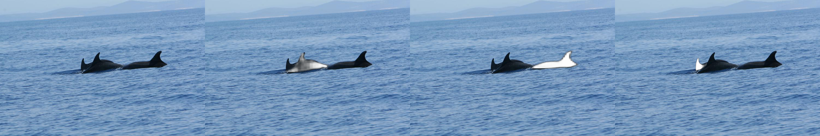

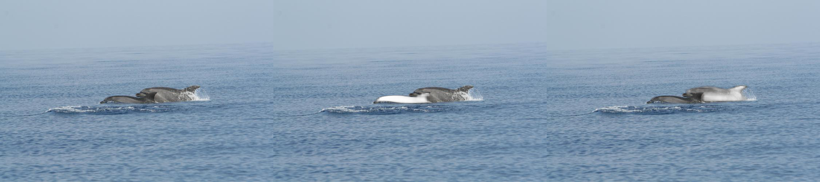

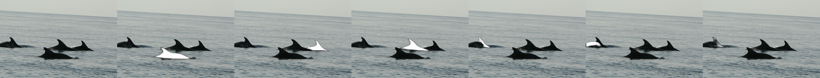

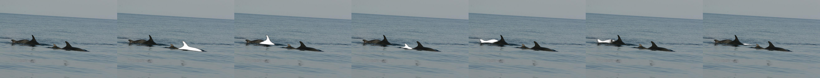

Epoch #6
Epoch: [6]  [ 0/40]  eta: 0:01:29  lr: 0.005000  loss: 0.5064 (0.5064)  loss_classifier: 0.0985 (0.0985)  loss_box_reg: 0.2312 (0.2312)  loss_mask: 0.1590 (0.1590)  loss_objectness: 0.0021 (0.0021)  loss_rpn_box_reg: 0.0156 (0.0156)  time: 2.2446  data: 1.4867  max mem: 5184
Epoch: [6]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.3094 (0.3353)  loss_classifier: 0.0516 (0.0557)  loss_box_reg: 0.1141 (0.1207)  loss_mask: 0.1332 (0.1414)  loss_objectness: 0.0026 (0.0039)  loss_rpn_box_reg: 0.0071 (0.0136)  time: 0.7062  data: 0.0095  max mem: 5184
Epoch: [6]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.2936 (0.3315)  loss_classifier: 0.0472 (0.0526)  loss_box_reg: 0.0967 (0.1127)  loss_mask: 0.1309 (0.1436)  loss_objectness: 0.0015 (0.0041)  loss_rpn_box_reg: 0.0090 (0.0185)  time: 0.6921  data: 0.0115  max mem: 5184
Epoch: [6] Total time: 0:00:29 (0.7397 s / it)


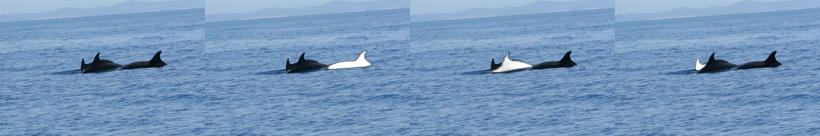

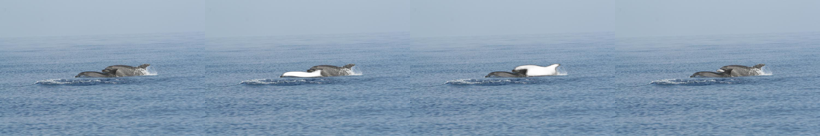

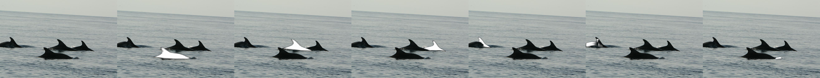

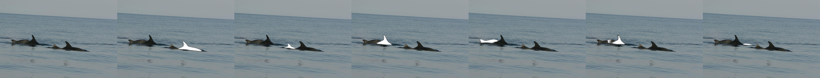

Epoch #7
Epoch: [7]  [ 0/40]  eta: 0:01:12  lr: 0.005000  loss: 0.1932 (0.1932)  loss_classifier: 0.0261 (0.0261)  loss_box_reg: 0.0535 (0.0535)  loss_mask: 0.1111 (0.1111)  loss_objectness: 0.0003 (0.0003)  loss_rpn_box_reg: 0.0022 (0.0022)  time: 1.8197  data: 1.1060  max mem: 5184
Epoch: [7]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.2937 (0.3245)  loss_classifier: 0.0437 (0.0440)  loss_box_reg: 0.0897 (0.0923)  loss_mask: 0.1387 (0.1486)  loss_objectness: 0.0015 (0.0039)  loss_rpn_box_reg: 0.0110 (0.0356)  time: 0.6996  data: 0.0108  max mem: 5184
Epoch: [7]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.3200 (0.3151)  loss_classifier: 0.0451 (0.0451)  loss_box_reg: 0.0932 (0.0951)  loss_mask: 0.1350 (0.1472)  loss_objectness: 0.0014 (0.0032)  loss_rpn_box_reg: 0.0065 (0.0245)  time: 0.6988  data: 0.0108  max mem: 5184
Epoch: [7] Total time: 0:00:29 (0.7286 s / it)


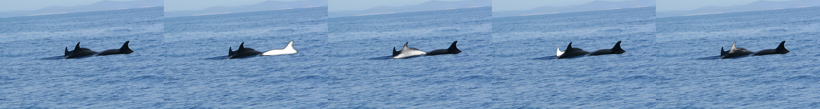

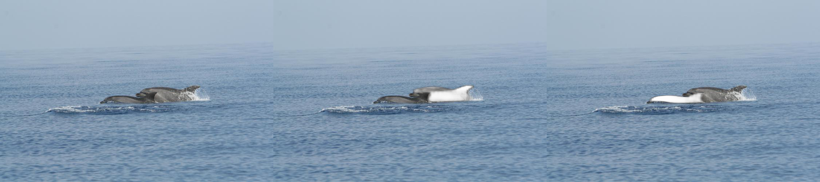

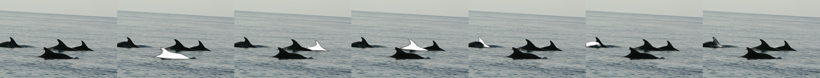

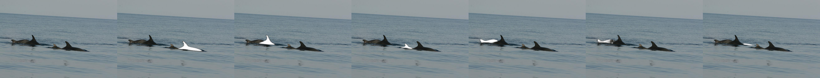

Epoch #8
Epoch: [8]  [ 0/40]  eta: 0:01:09  lr: 0.005000  loss: 0.2536 (0.2536)  loss_classifier: 0.0401 (0.0401)  loss_box_reg: 0.0834 (0.0834)  loss_mask: 0.1269 (0.1269)  loss_objectness: 0.0009 (0.0009)  loss_rpn_box_reg: 0.0023 (0.0023)  time: 1.7284  data: 0.9547  max mem: 5184
Epoch: [8]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.2612 (0.2659)  loss_classifier: 0.0378 (0.0378)  loss_box_reg: 0.0776 (0.0778)  loss_mask: 0.1477 (0.1387)  loss_objectness: 0.0019 (0.0023)  loss_rpn_box_reg: 0.0059 (0.0094)  time: 0.7062  data: 0.0112  max mem: 5184
Epoch: [8]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.2860 (0.2851)  loss_classifier: 0.0403 (0.0394)  loss_box_reg: 0.0981 (0.0864)  loss_mask: 0.1351 (0.1393)  loss_objectness: 0.0016 (0.0031)  loss_rpn_box_reg: 0.0058 (0.0169)  time: 0.6943  data: 0.0105  max mem: 5184
Epoch: [8] Total time: 0:00:29 (0.7278 s / it)


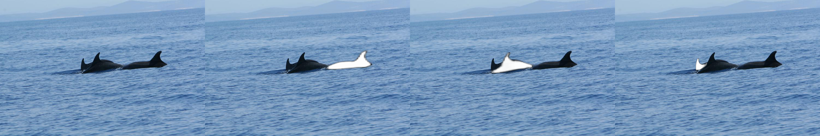

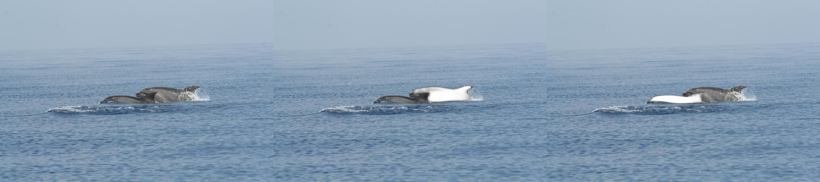

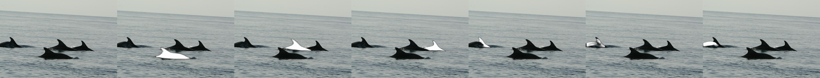

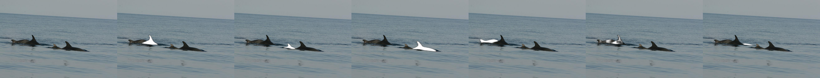

Epoch #9
Epoch: [9]  [ 0/40]  eta: 0:01:11  lr: 0.005000  loss: 0.1692 (0.1692)  loss_classifier: 0.0255 (0.0255)  loss_box_reg: 0.0556 (0.0556)  loss_mask: 0.0842 (0.0842)  loss_objectness: 0.0012 (0.0012)  loss_rpn_box_reg: 0.0027 (0.0027)  time: 1.7767  data: 1.0636  max mem: 5184
Epoch: [9]  [20/40]  eta: 0:00:15  lr: 0.005000  loss: 0.2431 (0.2624)  loss_classifier: 0.0352 (0.0382)  loss_box_reg: 0.0758 (0.0855)  loss_mask: 0.1279 (0.1274)  loss_objectness: 0.0012 (0.0021)  loss_rpn_box_reg: 0.0060 (0.0091)  time: 0.7128  data: 0.0116  max mem: 5184
Epoch: [9]  [39/40]  eta: 0:00:00  lr: 0.005000  loss: 0.2636 (0.2727)  loss_classifier: 0.0362 (0.0386)  loss_box_reg: 0.0834 (0.0877)  loss_mask: 0.1321 (0.1314)  loss_objectness: 0.0012 (0.0020)  loss_rpn_box_reg: 0.0055 (0.0129)  time: 0.6910  data: 0.0106  max mem: 5184
Epoch: [9] Total time: 0:00:29 (0.7298 s / it)


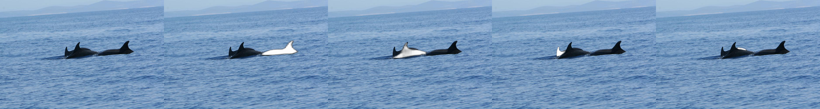

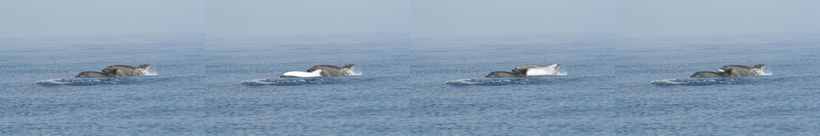

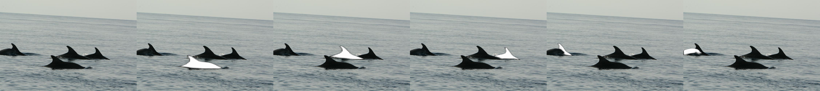

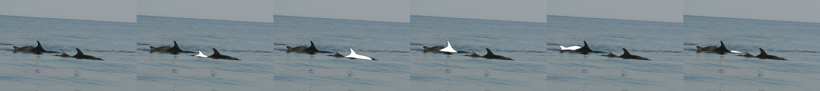

Epoch #10
Epoch: [10]  [ 0/40]  eta: 0:01:12  lr: 0.000500  loss: 0.2289 (0.2289)  loss_classifier: 0.0366 (0.0366)  loss_box_reg: 0.0827 (0.0827)  loss_mask: 0.1062 (0.1062)  loss_objectness: 0.0002 (0.0002)  loss_rpn_box_reg: 0.0032 (0.0032)  time: 1.8083  data: 1.0325  max mem: 5184
Epoch: [10]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2486 (0.2666)  loss_classifier: 0.0378 (0.0377)  loss_box_reg: 0.0734 (0.0805)  loss_mask: 0.1334 (0.1369)  loss_objectness: 0.0017 (0.0020)  loss_rpn_box_reg: 0.0065 (0.0095)  time: 0.7032  data: 0.0101  max mem: 5184
Epoch: [10]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2506 (0.2622)  loss_classifier: 0.0320 (0.0367)  loss_box_reg: 0.0679 (0.0764)  loss_mask: 0.1298 (0.1309)  loss_objectness: 0.0015 (0.0021)  loss_rpn_box_reg: 0.0052 (0.0162)  time: 0.6964  data: 0.0108  max mem: 5184
Epoch: [10] Total time: 0:00:29 (0.7291 s / it)


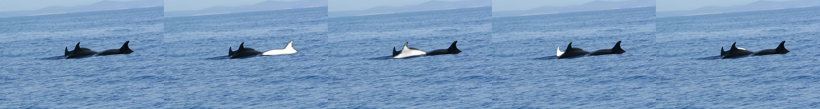

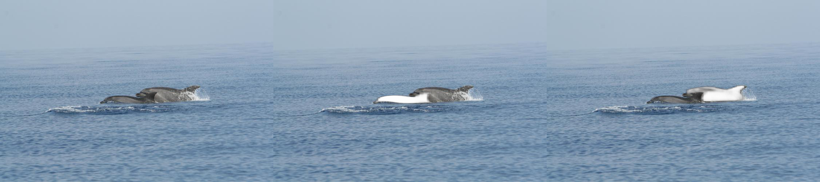

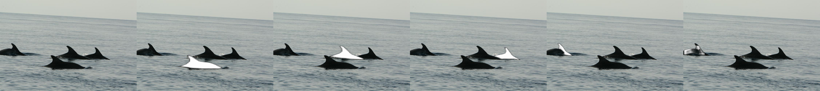

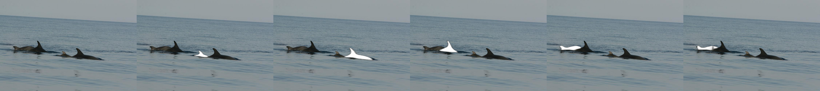

Epoch #11
Epoch: [11]  [ 0/40]  eta: 0:01:12  lr: 0.000500  loss: 0.2219 (0.2219)  loss_classifier: 0.0345 (0.0345)  loss_box_reg: 0.0689 (0.0689)  loss_mask: 0.1147 (0.1147)  loss_objectness: 0.0003 (0.0003)  loss_rpn_box_reg: 0.0036 (0.0036)  time: 1.8124  data: 1.0731  max mem: 5184
Epoch: [11]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2248 (0.2356)  loss_classifier: 0.0337 (0.0353)  loss_box_reg: 0.0615 (0.0695)  loss_mask: 0.1199 (0.1224)  loss_objectness: 0.0012 (0.0018)  loss_rpn_box_reg: 0.0047 (0.0067)  time: 0.7045  data: 0.0090  max mem: 5184
Epoch: [11]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2643 (0.2487)  loss_classifier: 0.0335 (0.0350)  loss_box_reg: 0.0699 (0.0712)  loss_mask: 0.1345 (0.1264)  loss_objectness: 0.0017 (0.0021)  loss_rpn_box_reg: 0.0041 (0.0142)  time: 0.6883  data: 0.0098  max mem: 5184
Epoch: [11] Total time: 0:00:29 (0.7259 s / it)


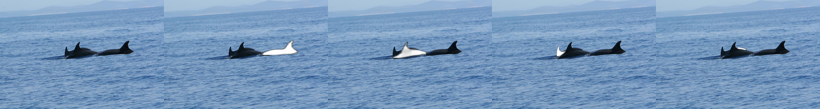

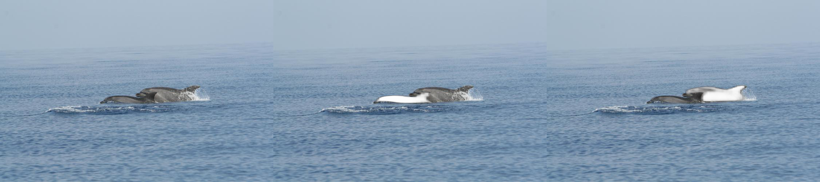

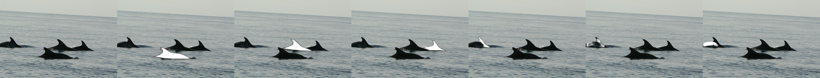

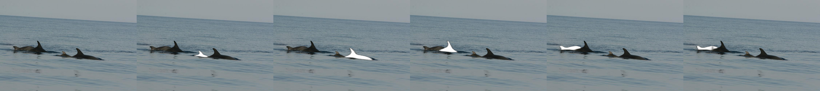

Epoch #12
Epoch: [12]  [ 0/40]  eta: 0:01:16  lr: 0.000500  loss: 0.2600 (0.2600)  loss_classifier: 0.0448 (0.0448)  loss_box_reg: 0.0719 (0.0719)  loss_mask: 0.1387 (0.1387)  loss_objectness: 0.0019 (0.0019)  loss_rpn_box_reg: 0.0027 (0.0027)  time: 1.9200  data: 1.1551  max mem: 5184
Epoch: [12]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2237 (0.2276)  loss_classifier: 0.0311 (0.0347)  loss_box_reg: 0.0650 (0.0655)  loss_mask: 0.1177 (0.1200)  loss_objectness: 0.0013 (0.0020)  loss_rpn_box_reg: 0.0031 (0.0055)  time: 0.7045  data: 0.0097  max mem: 5184
Epoch: [12]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2269 (0.2444)  loss_classifier: 0.0323 (0.0352)  loss_box_reg: 0.0577 (0.0667)  loss_mask: 0.1259 (0.1271)  loss_objectness: 0.0013 (0.0021)  loss_rpn_box_reg: 0.0049 (0.0133)  time: 0.6968  data: 0.0102  max mem: 5184
Epoch: [12] Total time: 0:00:29 (0.7330 s / it)


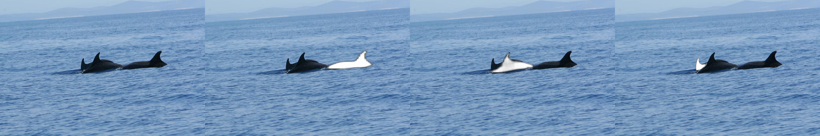

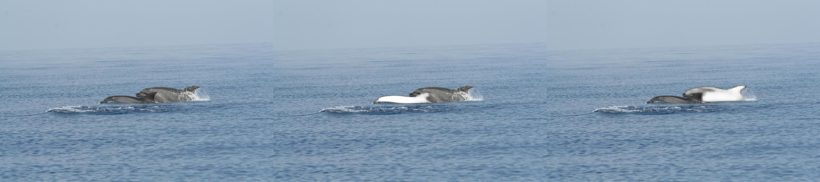

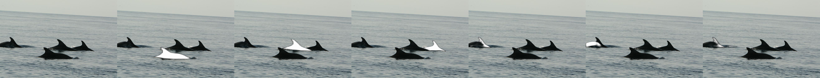

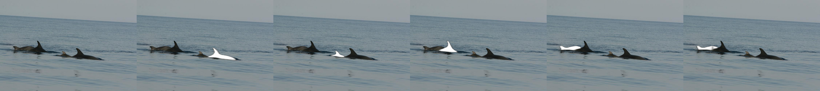

Epoch #13
Epoch: [13]  [ 0/40]  eta: 0:01:06  lr: 0.000500  loss: 0.1556 (0.1556)  loss_classifier: 0.0253 (0.0253)  loss_box_reg: 0.0405 (0.0405)  loss_mask: 0.0877 (0.0877)  loss_objectness: 0.0003 (0.0003)  loss_rpn_box_reg: 0.0017 (0.0017)  time: 1.6668  data: 0.9453  max mem: 5184
Epoch: [13]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2211 (0.2417)  loss_classifier: 0.0296 (0.0330)  loss_box_reg: 0.0577 (0.0643)  loss_mask: 0.1178 (0.1231)  loss_objectness: 0.0014 (0.0023)  loss_rpn_box_reg: 0.0055 (0.0190)  time: 0.7137  data: 0.0119  max mem: 5184
Epoch: [13]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2276 (0.2414)  loss_classifier: 0.0337 (0.0346)  loss_box_reg: 0.0658 (0.0669)  loss_mask: 0.1208 (0.1259)  loss_objectness: 0.0009 (0.0019)  loss_rpn_box_reg: 0.0033 (0.0122)  time: 0.7012  data: 0.0107  max mem: 5184
Epoch: [13] Total time: 0:00:29 (0.7336 s / it)


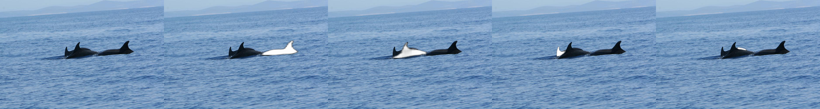

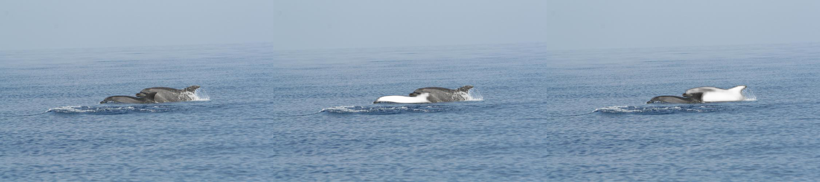

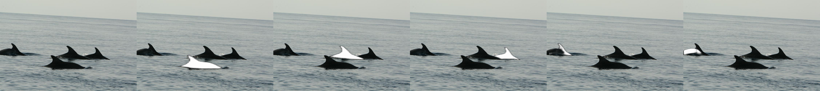

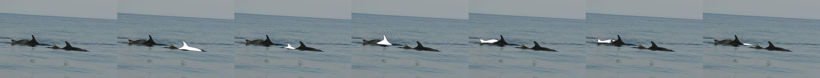

Epoch #14
Epoch: [14]  [ 0/40]  eta: 0:01:08  lr: 0.000500  loss: 0.2817 (0.2817)  loss_classifier: 0.0403 (0.0403)  loss_box_reg: 0.0911 (0.0911)  loss_mask: 0.1396 (0.1396)  loss_objectness: 0.0022 (0.0022)  loss_rpn_box_reg: 0.0085 (0.0085)  time: 1.7222  data: 1.0120  max mem: 5184
Epoch: [14]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2174 (0.2333)  loss_classifier: 0.0272 (0.0322)  loss_box_reg: 0.0588 (0.0655)  loss_mask: 0.1230 (0.1280)  loss_objectness: 0.0010 (0.0014)  loss_rpn_box_reg: 0.0031 (0.0062)  time: 0.7099  data: 0.0097  max mem: 5184
Epoch: [14]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2480 (0.2396)  loss_classifier: 0.0339 (0.0333)  loss_box_reg: 0.0685 (0.0671)  loss_mask: 0.1205 (0.1263)  loss_objectness: 0.0013 (0.0019)  loss_rpn_box_reg: 0.0036 (0.0109)  time: 0.7096  data: 0.0115  max mem: 5184
Epoch: [14] Total time: 0:00:29 (0.7360 s / it)


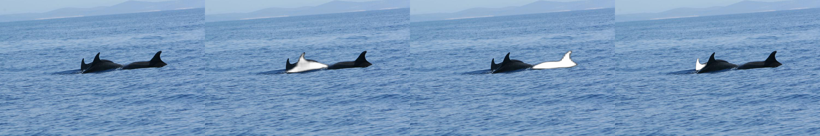

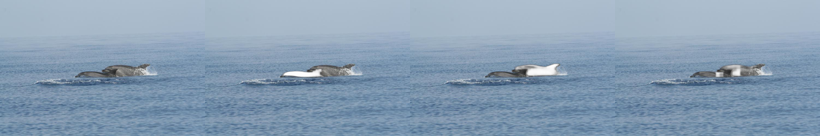

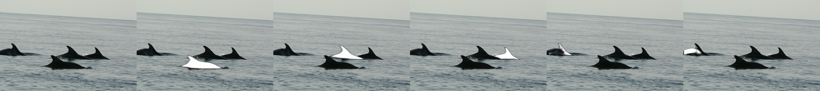

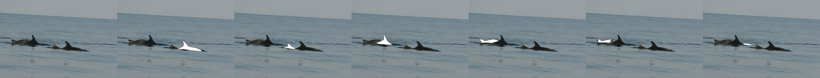

Epoch #15
Epoch: [15]  [ 0/40]  eta: 0:01:17  lr: 0.000500  loss: 0.3109 (0.3109)  loss_classifier: 0.0490 (0.0490)  loss_box_reg: 0.1067 (0.1067)  loss_mask: 0.1479 (0.1479)  loss_objectness: 0.0007 (0.0007)  loss_rpn_box_reg: 0.0066 (0.0066)  time: 1.9301  data: 1.1670  max mem: 5184
Epoch: [15]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2500 (0.2592)  loss_classifier: 0.0344 (0.0361)  loss_box_reg: 0.0726 (0.0741)  loss_mask: 0.1326 (0.1314)  loss_objectness: 0.0012 (0.0025)  loss_rpn_box_reg: 0.0049 (0.0151)  time: 0.7194  data: 0.0095  max mem: 5184
Epoch: [15]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2167 (0.2348)  loss_classifier: 0.0272 (0.0328)  loss_box_reg: 0.0558 (0.0662)  loss_mask: 0.1162 (0.1239)  loss_objectness: 0.0005 (0.0018)  loss_rpn_box_reg: 0.0028 (0.0101)  time: 0.6981  data: 0.0104  max mem: 5184
Epoch: [15] Total time: 0:00:29 (0.7407 s / it)


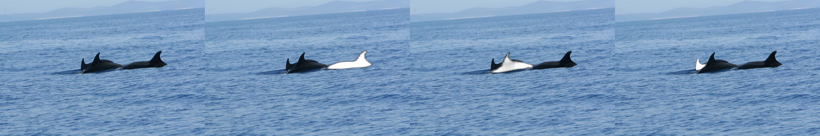

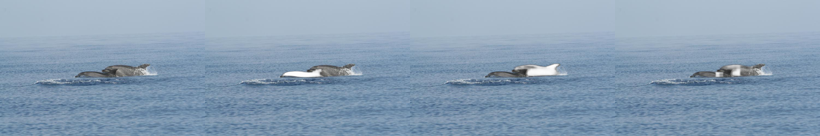

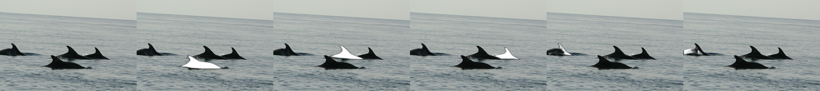

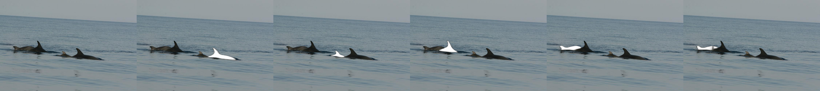

Epoch #16
Epoch: [16]  [ 0/40]  eta: 0:01:13  lr: 0.000500  loss: 0.1478 (0.1478)  loss_classifier: 0.0202 (0.0202)  loss_box_reg: 0.0276 (0.0276)  loss_mask: 0.0988 (0.0988)  loss_objectness: 0.0002 (0.0002)  loss_rpn_box_reg: 0.0010 (0.0010)  time: 1.8302  data: 1.0623  max mem: 5184
Epoch: [16]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2411 (0.2373)  loss_classifier: 0.0347 (0.0346)  loss_box_reg: 0.0677 (0.0682)  loss_mask: 0.1239 (0.1277)  loss_objectness: 0.0010 (0.0018)  loss_rpn_box_reg: 0.0031 (0.0051)  time: 0.7292  data: 0.0127  max mem: 5184
Epoch: [16]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.1887 (0.2355)  loss_classifier: 0.0273 (0.0331)  loss_box_reg: 0.0498 (0.0659)  loss_mask: 0.1088 (0.1238)  loss_objectness: 0.0007 (0.0014)  loss_rpn_box_reg: 0.0037 (0.0112)  time: 0.7056  data: 0.0118  max mem: 5184
Epoch: [16] Total time: 0:00:29 (0.7470 s / it)


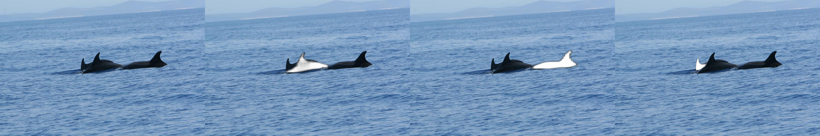

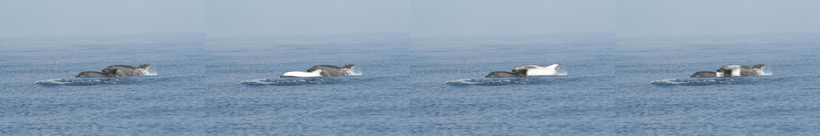

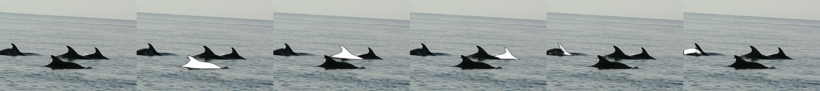

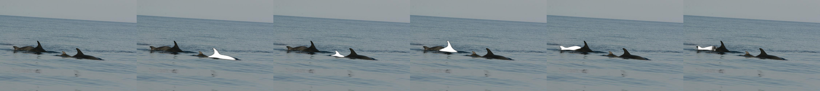

Epoch #17
Epoch: [17]  [ 0/40]  eta: 0:01:09  lr: 0.000500  loss: 0.3098 (0.3098)  loss_classifier: 0.0367 (0.0367)  loss_box_reg: 0.0874 (0.0874)  loss_mask: 0.1674 (0.1674)  loss_objectness: 0.0004 (0.0004)  loss_rpn_box_reg: 0.0179 (0.0179)  time: 1.7468  data: 1.0127  max mem: 5184
Epoch: [17]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2099 (0.2350)  loss_classifier: 0.0314 (0.0342)  loss_box_reg: 0.0605 (0.0680)  loss_mask: 0.1300 (0.1252)  loss_objectness: 0.0013 (0.0013)  loss_rpn_box_reg: 0.0040 (0.0062)  time: 0.7179  data: 0.0102  max mem: 5184
Epoch: [17]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2091 (0.2335)  loss_classifier: 0.0297 (0.0334)  loss_box_reg: 0.0629 (0.0653)  loss_mask: 0.1217 (0.1248)  loss_objectness: 0.0010 (0.0014)  loss_rpn_box_reg: 0.0036 (0.0086)  time: 0.6940  data: 0.0100  max mem: 5184
Epoch: [17] Total time: 0:00:29 (0.7339 s / it)


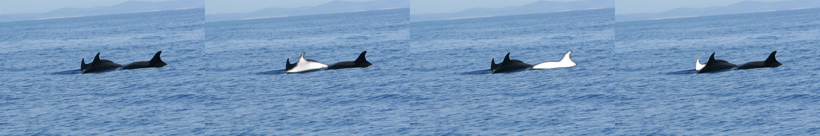

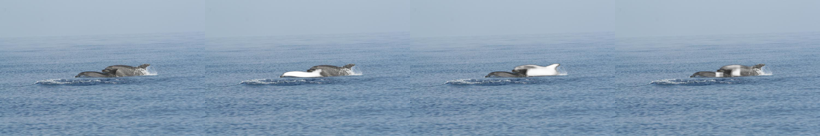

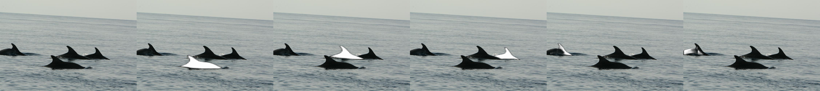

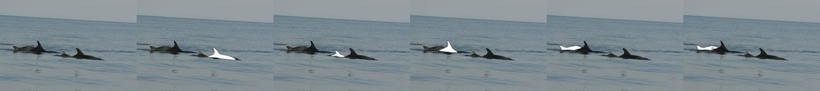

Epoch #18
Epoch: [18]  [ 0/40]  eta: 0:01:22  lr: 0.000500  loss: 0.2601 (0.2601)  loss_classifier: 0.0414 (0.0414)  loss_box_reg: 0.0775 (0.0775)  loss_mask: 0.1370 (0.1370)  loss_objectness: 0.0004 (0.0004)  loss_rpn_box_reg: 0.0038 (0.0038)  time: 2.0580  data: 1.2181  max mem: 5184
Epoch: [18]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2506 (0.2485)  loss_classifier: 0.0330 (0.0353)  loss_box_reg: 0.0660 (0.0708)  loss_mask: 0.1158 (0.1283)  loss_objectness: 0.0015 (0.0023)  loss_rpn_box_reg: 0.0041 (0.0119)  time: 0.7233  data: 0.0114  max mem: 5184
Epoch: [18]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.1928 (0.2297)  loss_classifier: 0.0268 (0.0324)  loss_box_reg: 0.0501 (0.0648)  loss_mask: 0.1086 (0.1224)  loss_objectness: 0.0009 (0.0018)  loss_rpn_box_reg: 0.0032 (0.0083)  time: 0.6969  data: 0.0098  max mem: 5184
Epoch: [18] Total time: 0:00:29 (0.7447 s / it)


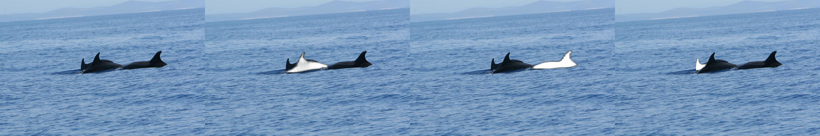

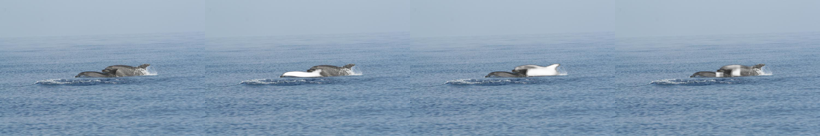

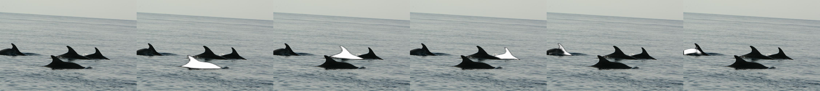

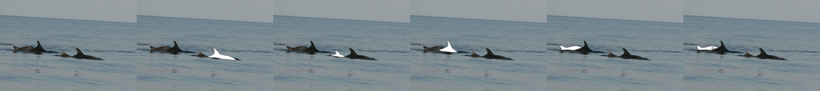

Epoch #19
Epoch: [19]  [ 0/40]  eta: 0:01:09  lr: 0.000500  loss: 0.1662 (0.1662)  loss_classifier: 0.0263 (0.0263)  loss_box_reg: 0.0364 (0.0364)  loss_mask: 0.1016 (0.1016)  loss_objectness: 0.0002 (0.0002)  loss_rpn_box_reg: 0.0017 (0.0017)  time: 1.7278  data: 1.0122  max mem: 5184
Epoch: [19]  [20/40]  eta: 0:00:15  lr: 0.000500  loss: 0.2307 (0.2294)  loss_classifier: 0.0311 (0.0337)  loss_box_reg: 0.0636 (0.0626)  loss_mask: 0.1232 (0.1232)  loss_objectness: 0.0008 (0.0014)  loss_rpn_box_reg: 0.0032 (0.0086)  time: 0.7123  data: 0.0130  max mem: 5184
Epoch: [19]  [39/40]  eta: 0:00:00  lr: 0.000500  loss: 0.2168 (0.2256)  loss_classifier: 0.0292 (0.0331)  loss_box_reg: 0.0590 (0.0629)  loss_mask: 0.1153 (0.1208)  loss_objectness: 0.0005 (0.0013)  loss_rpn_box_reg: 0.0038 (0.0074)  time: 0.6736  data: 0.0104  max mem: 5184
Epoch: [19] Total time: 0:00:28 (0.7197 s / it)


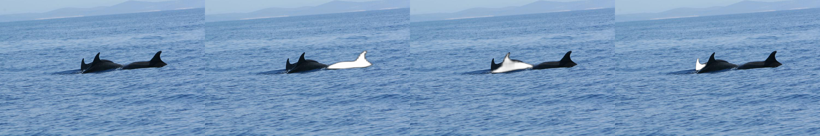

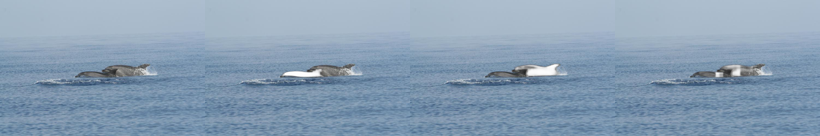

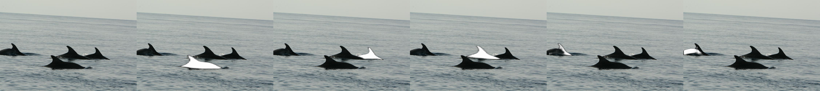

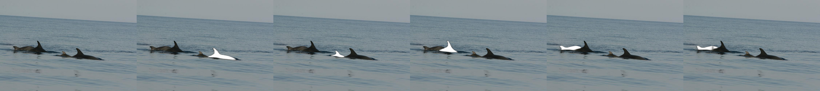

Epoch #20
Epoch: [20]  [ 0/40]  eta: 0:01:15  lr: 0.000050  loss: 0.2737 (0.2737)  loss_classifier: 0.0563 (0.0563)  loss_box_reg: 0.0844 (0.0844)  loss_mask: 0.1253 (0.1253)  loss_objectness: 0.0008 (0.0008)  loss_rpn_box_reg: 0.0070 (0.0070)  time: 1.8758  data: 1.1560  max mem: 5184
Epoch: [20]  [20/40]  eta: 0:00:14  lr: 0.000050  loss: 0.2166 (0.2160)  loss_classifier: 0.0273 (0.0318)  loss_box_reg: 0.0502 (0.0605)  loss_mask: 0.1030 (0.1130)  loss_objectness: 0.0005 (0.0012)  loss_rpn_box_reg: 0.0034 (0.0094)  time: 0.6707  data: 0.0081  max mem: 5184
Epoch: [20]  [39/40]  eta: 0:00:00  lr: 0.000050  loss: 0.2406 (0.2251)  loss_classifier: 0.0335 (0.0324)  loss_box_reg: 0.0612 (0.0637)  loss_mask: 0.1266 (0.1206)  loss_objectness: 0.0008 (0.0012)  loss_rpn_box_reg: 0.0040 (0.0073)  time: 0.6649  data: 0.0091  max mem: 5184
Epoch: [20] Total time: 0:00:27 (0.6989 s / it)


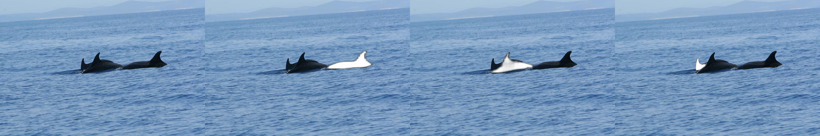

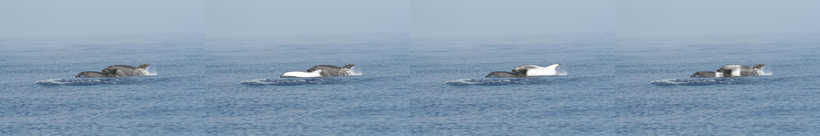

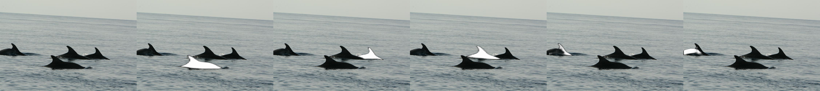

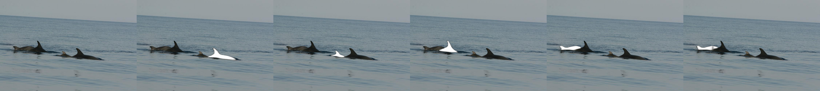

Epoch #21
Epoch: [21]  [ 0/40]  eta: 0:01:02  lr: 0.000050  loss: 0.2366 (0.2366)  loss_classifier: 0.0393 (0.0393)  loss_box_reg: 0.0681 (0.0681)  loss_mask: 0.1175 (0.1175)  loss_objectness: 0.0013 (0.0013)  loss_rpn_box_reg: 0.0104 (0.0104)  time: 1.5571  data: 0.8891  max mem: 5184
Epoch: [21]  [20/40]  eta: 0:00:14  lr: 0.000050  loss: 0.2197 (0.2336)  loss_classifier: 0.0321 (0.0322)  loss_box_reg: 0.0588 (0.0661)  loss_mask: 0.1131 (0.1171)  loss_objectness: 0.0011 (0.0022)  loss_rpn_box_reg: 0.0041 (0.0159)  time: 0.6746  data: 0.0106  max mem: 5184
Epoch: [21]  [39/40]  eta: 0:00:00  lr: 0.000050  loss: 0.2332 (0.2297)  loss_classifier: 0.0318 (0.0323)  loss_box_reg: 0.0613 (0.0640)  loss_mask: 0.1208 (0.1213)  loss_objectness: 0.0006 (0.0015)  loss_rpn_box_reg: 0.0035 (0.0106)  time: 0.6628  data: 0.0091  max mem: 5184
Epoch: [21] Total time: 0:00:27 (0.6925 s / it)


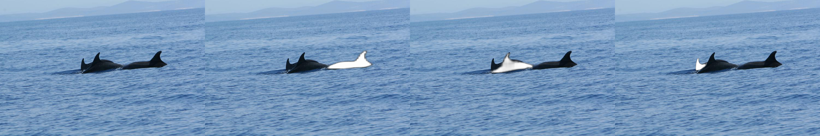

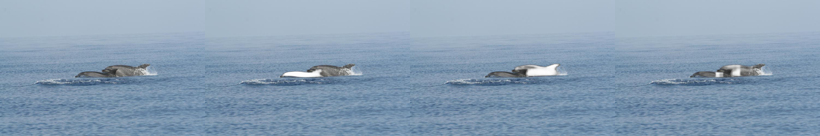

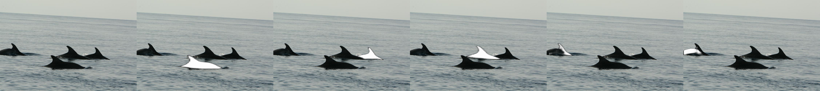

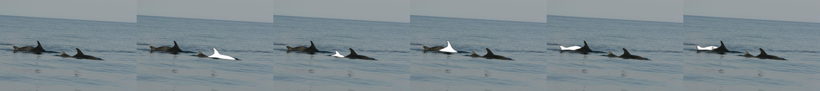

Epoch #22
Epoch: [22]  [ 0/40]  eta: 0:01:05  lr: 0.000050  loss: 0.2181 (0.2181)  loss_classifier: 0.0166 (0.0166)  loss_box_reg: 0.0581 (0.0581)  loss_mask: 0.1367 (0.1367)  loss_objectness: 0.0048 (0.0048)  loss_rpn_box_reg: 0.0019 (0.0019)  time: 1.6301  data: 0.9649  max mem: 5184
Epoch: [22]  [20/40]  eta: 0:00:14  lr: 0.000050  loss: 0.2532 (0.2480)  loss_classifier: 0.0316 (0.0342)  loss_box_reg: 0.0700 (0.0709)  loss_mask: 0.1283 (0.1307)  loss_objectness: 0.0009 (0.0020)  loss_rpn_box_reg: 0.0036 (0.0103)  time: 0.6778  data: 0.0101  max mem: 5184
Epoch: [22]  [39/40]  eta: 0:00:00  lr: 0.000050  loss: 0.2096 (0.2286)  loss_classifier: 0.0316 (0.0328)  loss_box_reg: 0.0609 (0.0650)  loss_mask: 0.1102 (0.1217)  loss_objectness: 0.0007 (0.0016)  loss_rpn_box_reg: 0.0033 (0.0075)  time: 0.6635  data: 0.0093  max mem: 5184
Epoch: [22] Total time: 0:00:27 (0.6966 s / it)


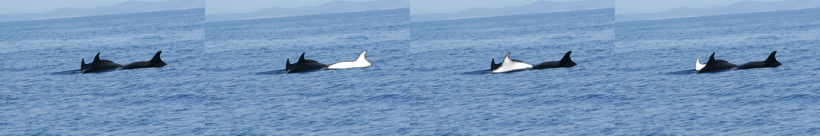

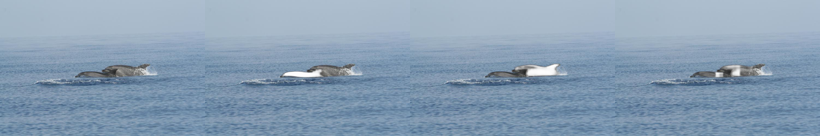

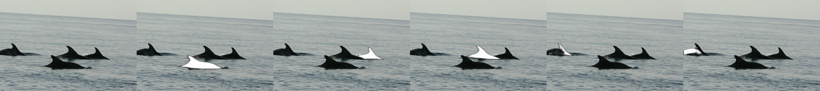

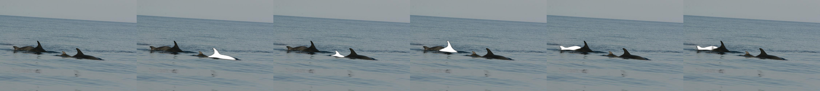

Epoch #23
Epoch: [23]  [ 0/40]  eta: 0:01:06  lr: 0.000050  loss: 0.1797 (0.1797)  loss_classifier: 0.0221 (0.0221)  loss_box_reg: 0.0366 (0.0366)  loss_mask: 0.1077 (0.1077)  loss_objectness: 0.0039 (0.0039)  loss_rpn_box_reg: 0.0094 (0.0094)  time: 1.6502  data: 0.9044  max mem: 5184
Epoch: [23]  [20/40]  eta: 0:00:15  lr: 0.000050  loss: 0.2466 (0.2486)  loss_classifier: 0.0358 (0.0348)  loss_box_reg: 0.0692 (0.0703)  loss_mask: 0.1314 (0.1265)  loss_objectness: 0.0006 (0.0016)  loss_rpn_box_reg: 0.0048 (0.0154)  time: 0.7174  data: 0.0119  max mem: 5184
Epoch: [23]  [39/40]  eta: 0:00:00  lr: 0.000050  loss: 0.2023 (0.2328)  loss_classifier: 0.0287 (0.0326)  loss_box_reg: 0.0508 (0.0647)  loss_mask: 0.1117 (0.1228)  loss_objectness: 0.0008 (0.0018)  loss_rpn_box_reg: 0.0027 (0.0109)  time: 0.6972  data: 0.0099  max mem: 5184
Epoch: [23] Total time: 0:00:29 (0.7324 s / it)


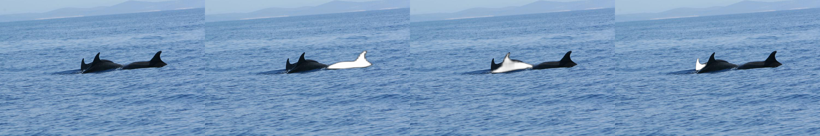

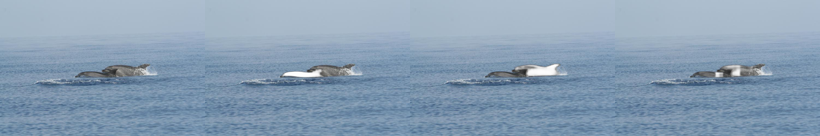

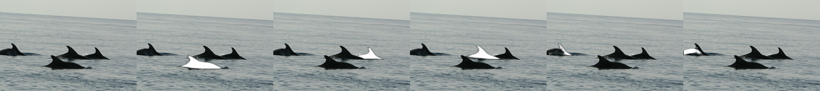

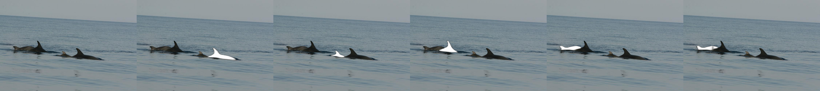

Epoch #24
Epoch: [24]  [ 0/40]  eta: 0:01:13  lr: 0.000050  loss: 0.2915 (0.2915)  loss_classifier: 0.0310 (0.0310)  loss_box_reg: 0.0940 (0.0940)  loss_mask: 0.1547 (0.1547)  loss_objectness: 0.0009 (0.0009)  loss_rpn_box_reg: 0.0110 (0.0110)  time: 1.8347  data: 1.0780  max mem: 5184
Epoch: [24]  [20/40]  eta: 0:00:15  lr: 0.000050  loss: 0.2193 (0.2312)  loss_classifier: 0.0313 (0.0328)  loss_box_reg: 0.0587 (0.0628)  loss_mask: 0.1168 (0.1207)  loss_objectness: 0.0007 (0.0016)  loss_rpn_box_reg: 0.0033 (0.0132)  time: 0.7227  data: 0.0101  max mem: 5184
Epoch: [24]  [39/40]  eta: 0:00:00  lr: 0.000050  loss: 0.2031 (0.2271)  loss_classifier: 0.0327 (0.0325)  loss_box_reg: 0.0551 (0.0615)  loss_mask: 0.1157 (0.1217)  loss_objectness: 0.0009 (0.0015)  loss_rpn_box_reg: 0.0037 (0.0097)  time: 0.7101  data: 0.0110  max mem: 5184
Epoch: [24] Total time: 0:00:29 (0.7453 s / it)


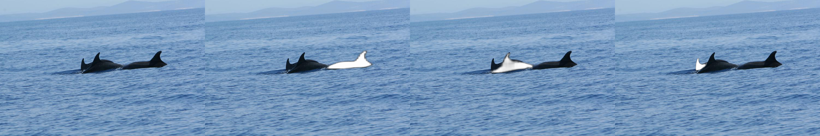

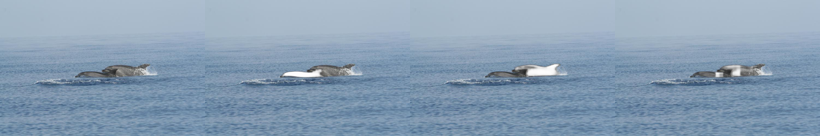

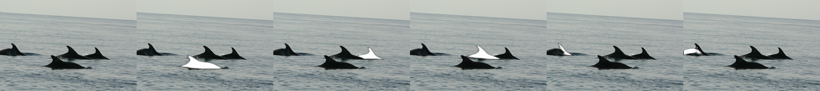

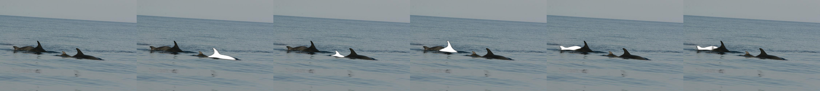

In [ ]:
from dolphins_recognition_challenge.instance_segmentation.model import train_one_epoch
from dolphins_recognition_challenge.instance_segmentation.model import show_predictions


num_epochs = 25

for epoch in range(num_epochs):
    # train for one epoch, printing every 20 iterations
    print(f"Epoch #{epoch}")
    
    # train for 1 epoch
    train_one_epoch(model, optimizer, data_loader, device, epoch=epoch, print_freq=20)
    
    # show predictions for four images
    show_predictions(model, data_loader=data_loader_test, n=4, score_threshold=0.5)
    
    # update learning rate
    lr_scheduler.step()

## Calculate metrics

Let's visualise a few samples and print out the IOU metric for theme:

IOU metric for the input image is: 0.6251223933663248


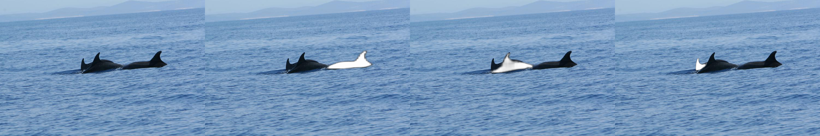

IOU metric for the input image is: 0.4379893456585233


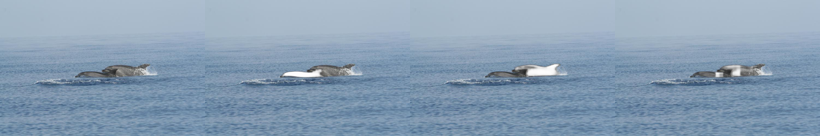

IOU metric for the input image is: 0.5739958461781077


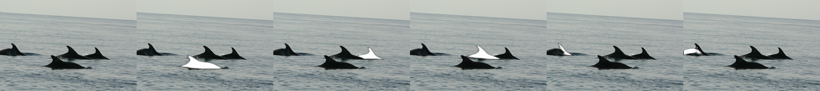

IOU metric for the input image is: 0.512340436420509


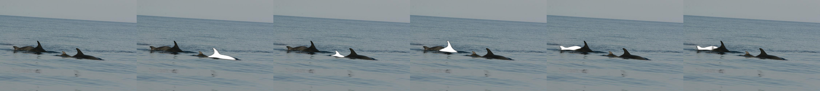

In [ ]:
from dolphins_recognition_challenge.instance_segmentation.model import show_prediction, iou_metric_example

for i in range(4):
    iou_test_image = iou_metric_example(model, data_loader_test.dataset[i], 0.5)
    img, _ = data_loader_test.dataset[i]
    print(f"IOU metric for the input image is: {iou_test_image}")
    show_prediction(model, img, width=820)


Calculate the mean IOU metric for the entire data set:

In [ ]:
%%time

from dolphins_recognition_challenge.instance_segmentation.model import iou_metric, show_predictions_sorted_by_iou

mean_iou_testset, _ = iou_metric(model, data_loader_test.dataset)

print(f"Mean IOU metric for the test set is: {mean_iou_testset}")

Mean IOU metric for the test set is: 0.45627599697440874
CPU times: user 11.2 s, sys: 27.4 ms, total: 11.2 s
Wall time: 7.24 s


...

IOU metric: 0.21618728681631277


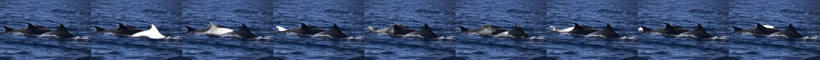

IOU metric: 0.22694083664029302


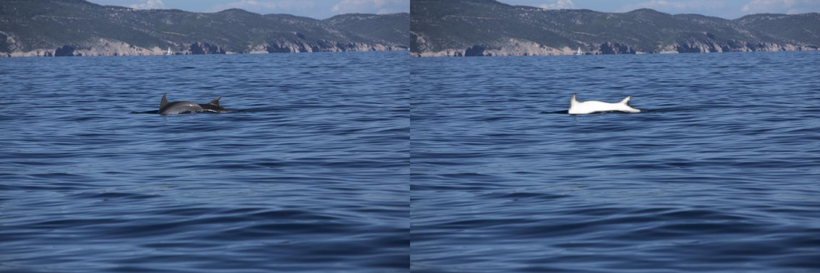

IOU metric: 0.24699791064305268


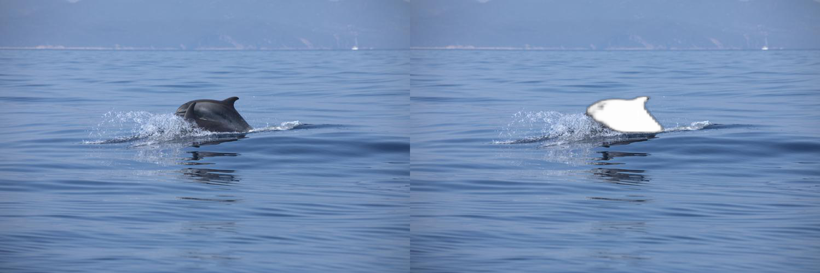

IOU metric: 0.27039879001200656


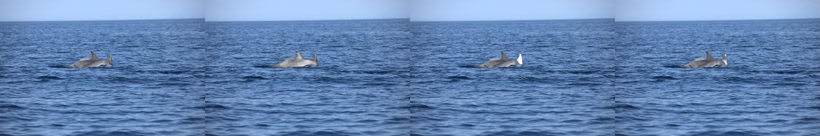

IOU metric: 0.2938322545273948


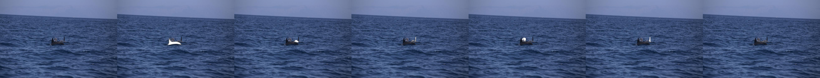

IOU metric: 0.3107042116746058


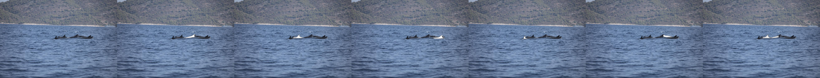

IOU metric: 0.3157153881954644


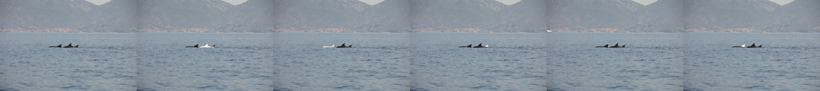

IOU metric: 0.3289042640753045


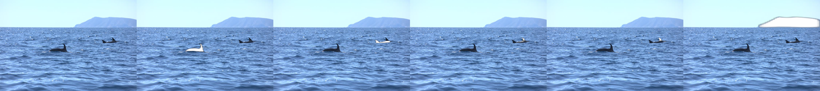

IOU metric: 0.3363051783350353


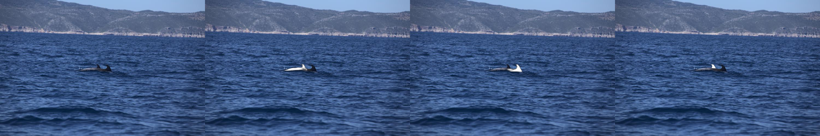

IOU metric: 0.3679085376594166


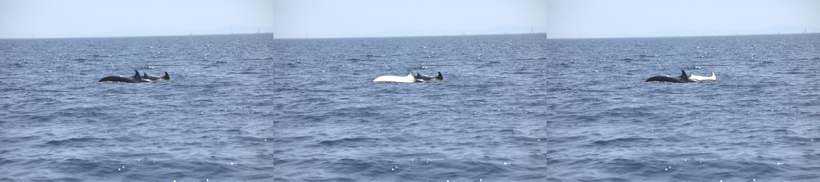

IOU metric: 0.3749183711507685


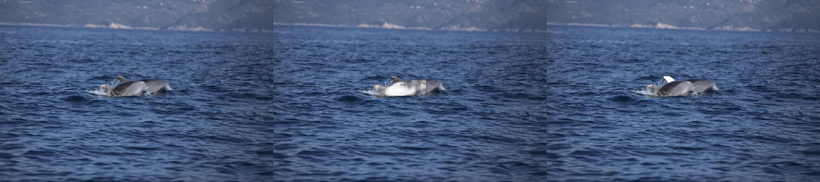

IOU metric: 0.37865332827502834


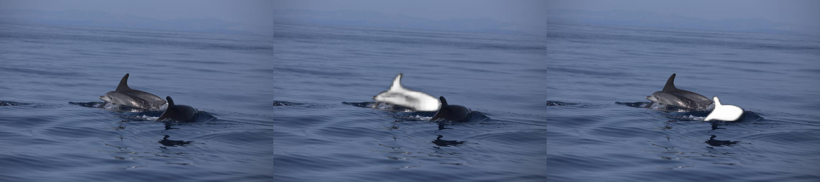

IOU metric: 0.38621437821325094


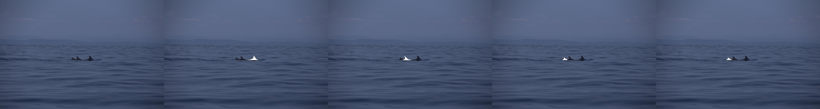

IOU metric: 0.38773643409961706


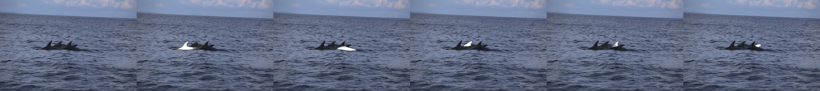

IOU metric: 0.39448361969914164


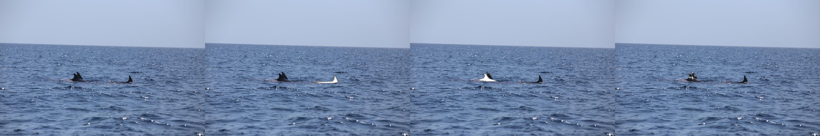

IOU metric: 0.40054106899107994


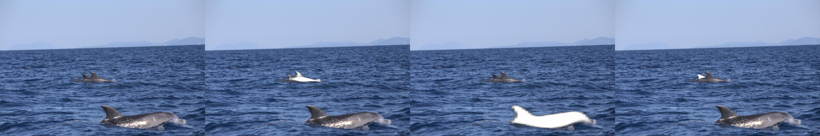

IOU metric: 0.400891555950254


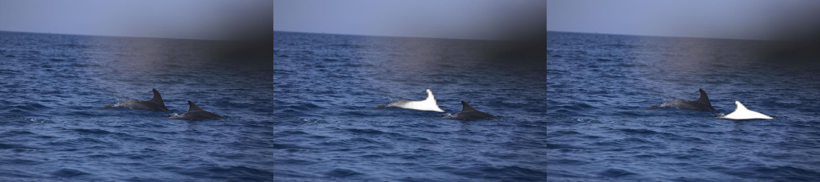

IOU metric: 0.4116969470545806


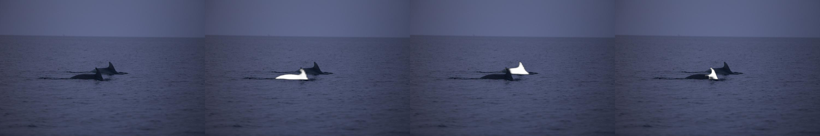

IOU metric: 0.42074812712710163


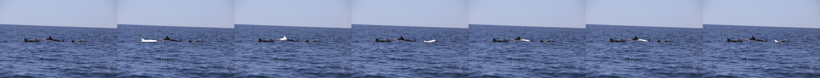

IOU metric: 0.426635861432593


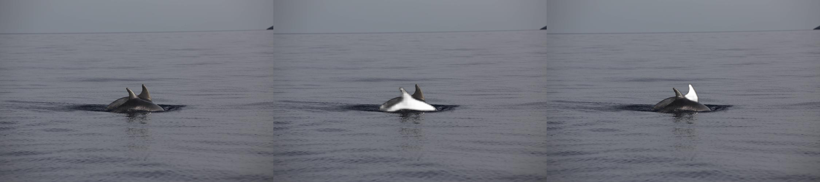

IOU metric: 0.4350047718834469


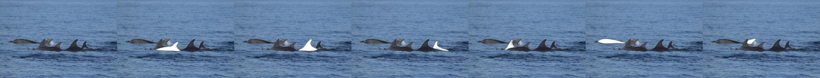

IOU metric: 0.4379893456585233


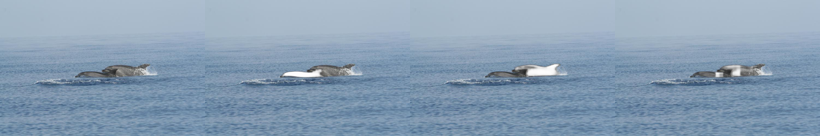

IOU metric: 0.44271148137339983


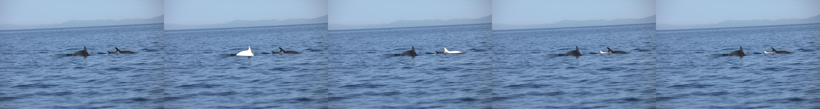

IOU metric: 0.4765071630442988


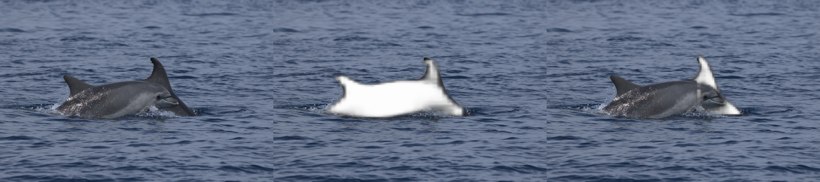

IOU metric: 0.4995835141968676


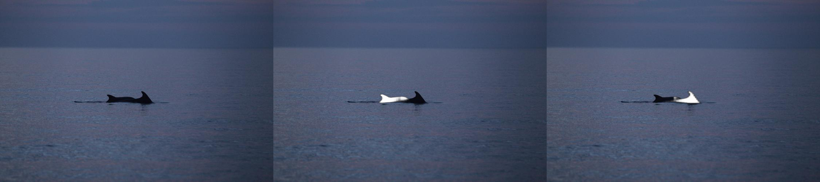

IOU metric: 0.512340436420509


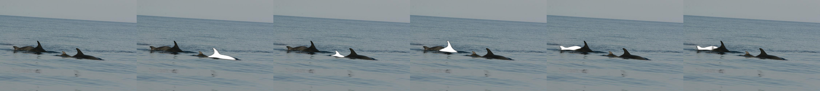

IOU metric: 0.5191379222612404


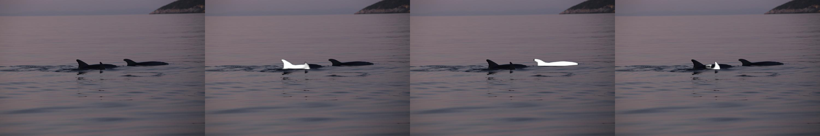

IOU metric: 0.5280241637656262


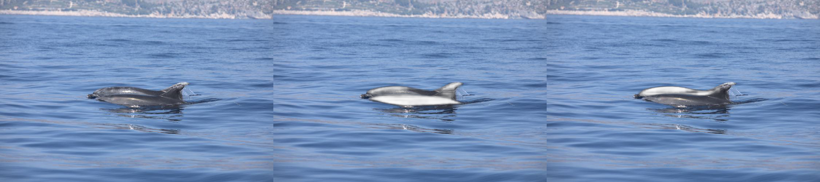

IOU metric: 0.5627043844968138


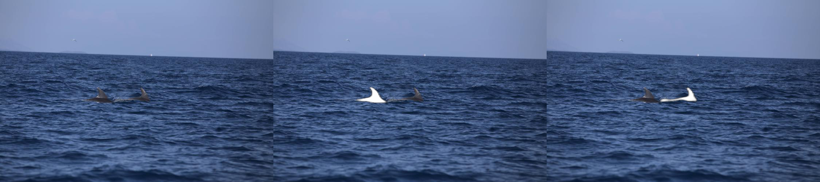

IOU metric: 0.5739958461781077


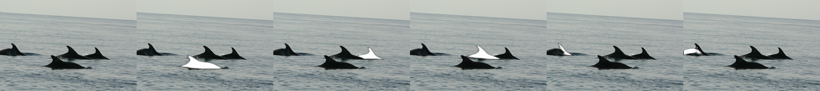

IOU metric: 0.5912480541484034


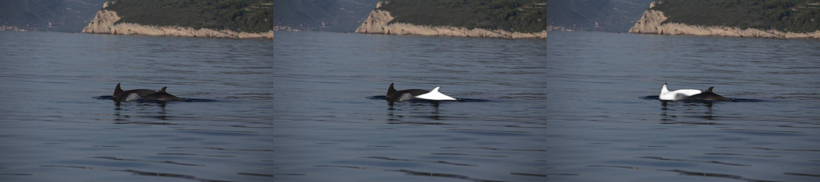

IOU metric: 0.6251223933663248


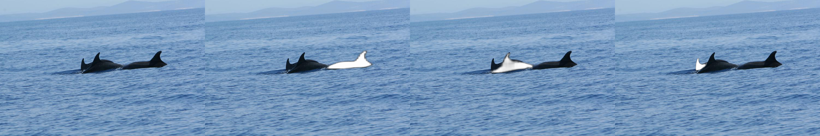

IOU metric: 0.6261068032145631


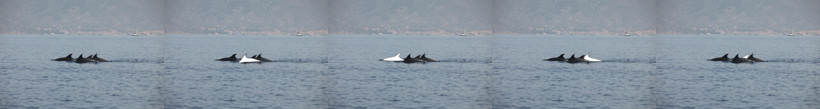

IOU metric: 0.6341297252238683


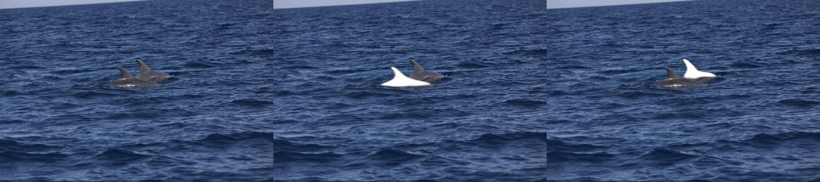

IOU metric: 0.6409686796352302


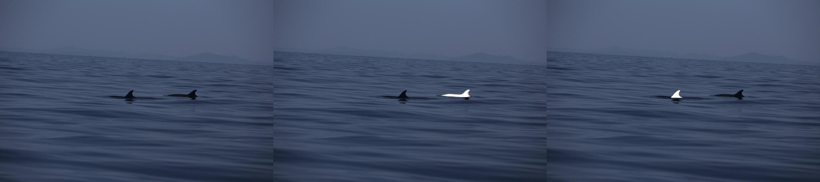

IOU metric: 0.6461457061884064


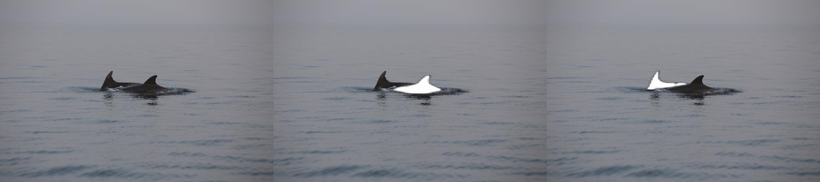

IOU metric: 0.6847688065992302


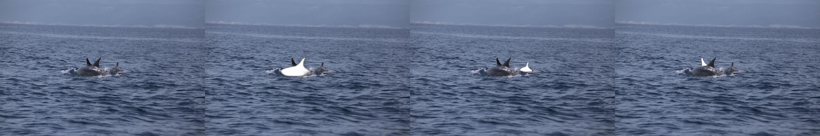

IOU metric: 0.6851730515435296


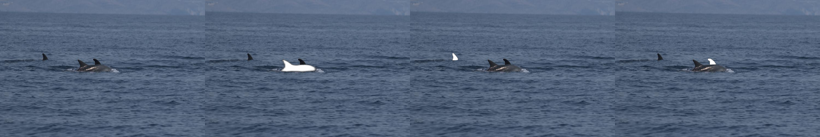

IOU metric: 0.7766872822312518


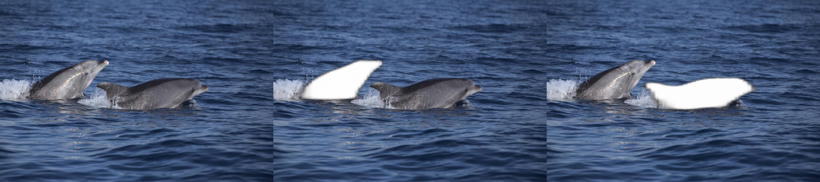

In [ ]:
show_predictions_sorted_by_iou(model, data_loader_test.dataset)

## Submit solution

Here we can see how to use the `submit_model` function. We must pass trained model, an alias that will be displayed on the leaderboard, name and email. Returns the path to the zipped file. 

In [ ]:
from dolphins_recognition_challenge.submissions import submit_model

zip_fname = submit_model(model, alias="dolphin123", name="Name Surname", email="name.surname@gmail.com")

Here we can check what is in the zip file. The zip file contains the model and 2 csv files. The first CSV file contains the iou metrics for each image from the validation set, and the second file contains information about the competitor.

In [ ]:
!unzip -vl "{zip_fname}"